In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

!pip install forex_python
from forex_python.converter import CurrencyRates
import pandas_profiling 
from sklearn.feature_selection import RFE
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold

You should consider upgrading via the 'c:\users\asus tuf\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [2]:
#pip install xlrd

In [3]:
 df=pd.read_csv('C:\\Users\\ASUS TUF\\Downloads\\H2HBABBA2989.csv')
# df=pd.read_csv('D:\\MINOR-MAJOR_project\\data.csv')


In [4]:
df.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
0,U001,0200707822,PUBLI associates,NaN,2020.0,1.930585e+09,2020-02-29,20200229,20200229,20200315.0,USD,RV,1.0,NaN,102194.67,20200229.0,NAA8,1.930585e+09,1
1,U001,0200744019,TARG trust,2019-10-22 00:00:00,2019.0,1.929975e+09,2019-10-08,20191006,20191008,20191023.0,USD,RV,1.0,NaN,18465.03,20191008.0,NAA8,1.929975e+09,0
2,U001,0200739534,OK foundation,2019-03-01 00:00:00,2019.0,1.928794e+09,2019-02-13,20190214,20190213,20190228.0,USD,RV,1.0,NaN,6645.18,20190213.0,NAA8,1.928794e+09,0
3,U001,0200707822,PUBLI corporation,2019-04-09 00:00:00,2019.0,1.929028e+09,2019-03-25,20190326,20190325,20190409.0,USD,RV,1.0,NaN,66342.23,20190325.0,NAA8,1.929028e+09,0
4,U001,0200229974,DARDEN D llc,2019-07-25 00:00:00,2019.0,1.929588e+09,2019-07-15,20190708,20190715,20190730.0,USD,RV,1.0,NaN,16615.26,20190715.0,NAA8,1.929588e+09,0


# Preprocessing

In [5]:
df.shape

(50000, 19)

In [6]:
df.isnull().any()

business_code             False
cust_number               False
name_customer             False
clear_date                 True
buisness_year             False
doc_id                    False
posting_date              False
document_create_date      False
document_create_date.1    False
due_in_date               False
invoice_currency          False
document type             False
posting_id                False
area_business              True
total_open_amount         False
baseline_create_date      False
cust_payment_terms        False
invoice_id                 True
isOpen                    False
dtype: bool

In [7]:
#df=df.dropna(axis=1)
df=df.drop(['area_business','invoice_id','posting_id'],axis=1)

In [8]:
df.tail()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,baseline_create_date,cust_payment_terms,isOpen
49995,U001,0200769623,WAL-MAR co,2019-07-05 00:00:00,2019.0,1.929530e+09,2019-06-23,20190621,20190623,20190708.0,USD,RV,6819.63,20190623.0,NAH4,0
49996,U001,0200706844,WINC corp,2019-09-13 00:00:00,2019.0,1.929807e+09,2019-08-29,20190829,20190829,20190913.0,USD,RV,11979.94,20190829.0,NAA8,0
49997,U001,0200772670,ASSOCIAT llc,NaN,2020.0,1.930629e+09,2020-03-09,20200310,20200309,20200324.0,USD,RV,5607.19,20200309.0,NAU5,1
49998,U001,0200780383,MEIJ corp,2019-05-02 00:00:00,2019.0,1.929146e+09,2019-04-15,20190415,20190415,20190430.0,USD,RV,90407.80,20190415.0,NAA8,0
49999,U001,0200786288,FAMILY us,2019-06-27 00:00:00,2019.0,1.929488e+09,2019-06-14,20190613,20190614,20190629.0,USD,RV,12322.55,20190614.0,NAC6,0


In [9]:
df=df[df['document type']=='RV']

In [10]:
cols=['name_customer','document type']
df=df.drop(cols,axis=1)

In [11]:
df.shape

(49991, 14)

In [12]:
df.dtypes

business_code              object
cust_number                object
clear_date                 object
buisness_year             float64
doc_id                    float64
posting_date               object
document_create_date        int64
document_create_date.1      int64
due_in_date               float64
invoice_currency           object
total_open_amount         float64
baseline_create_date      float64
cust_payment_terms         object
isOpen                      int64
dtype: object

In [13]:
df['posting_date']=pd.to_datetime(df['posting_date'])

df['clear_date']=pd.to_datetime(df['clear_date'])


In [14]:
df['due_in_date'] = pd.to_datetime(df['due_in_date'], format='%Y%m%d')

df['baseline_create_date'] = pd.to_datetime(df['baseline_create_date'], format='%Y%m%d')
df['document_create_date.1'] = pd.to_datetime(df['document_create_date.1'], format='%Y%m%d')
df['document_create_date'] = pd.to_datetime(df['document_create_date'], format='%Y%m%d')
df['clear_date']=pd.to_datetime(df['clear_date'])
df['posting_date']=pd.to_datetime(df['posting_date'])

In [15]:
df['buisness_year'] = pd.to_datetime(df['buisness_year'], format='%Y')

In [16]:
df[df.duplicated()]

,business_code,cust_number,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,isOpen
2201,U001,CCCA02,2019-06-28,2019-01-01,1.929301e+09,2019-05-15,2019-05-13,2019-05-15,2019-06-19,USD,13425.00,2019-05-15,NAG2,0
2632,U001,0200744019,NaT,2020-01-01,1.930655e+09,2020-03-16,2020-03-15,2020-03-16,2020-03-31,USD,72268.76,2020-03-16,NAA8,1
2706,U001,0200974851,2019-04-03,2019-01-01,1.928993e+09,2019-03-19,2019-03-19,2019-03-19,2019-04-03,USD,2863.20,2019-03-19,NAA8,0
3121,U001,0200200412,2019-11-15,2019-01-01,1.930077e+09,2019-11-01,2019-10-30,2019-11-01,2019-11-16,USD,43835.95,2019-11-01,NAA8,0
3283,U001,0200769623,2019-05-20,2019-01-01,1.929236e+09,2019-05-01,2019-05-01,2019-05-01,2019-05-16,USD,16192.53,2019-05-01,NAH4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49958,U001,0200707822,2019-03-04,2019-01-01,1.928807e+09,2019-02-15,2019-02-16,2019-02-15,2019-03-02,USD,74277.27,2019-02-15,NAA8,0
49961,U001,0200739534,NaT,2020-01-01,1.930827e+09,2020-04-25,2020-04-25,2020-04-25,2020-05-10,USD,31322.55,2020-04-25,NAA8,1
49977,CA02,0140106293,2019-07-05,2019-01-01,2.960556e+09,2019-06-20,2019-06-20,2019-06-20,2019-07-08,CAD,38.22,2019-06-28,CA10,0
49981,U001,0200772670,2019-09-12,2019-01-01,1.929801e+09,2019-08-27,2019-08-27,2019-08-27,2019-09-11,USD,2546.83,2019-08-27,NAU5,0


In [17]:
df.duplicated().sum()
df=df.drop_duplicates(keep='first')
df

,business_code,cust_number,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,isOpen
0,U001,0200707822,NaT,2020-01-01,1.930585e+09,2020-02-29,2020-02-29,2020-02-29,2020-03-15,USD,102194.67,2020-02-29,NAA8,1
1,U001,0200744019,2019-10-22,2019-01-01,1.929975e+09,2019-10-08,2019-10-06,2019-10-08,2019-10-23,USD,18465.03,2019-10-08,NAA8,0
2,U001,0200739534,2019-03-01,2019-01-01,1.928794e+09,2019-02-13,2019-02-14,2019-02-13,2019-02-28,USD,6645.18,2019-02-13,NAA8,0
3,U001,0200707822,2019-04-09,2019-01-01,1.929028e+09,2019-03-25,2019-03-26,2019-03-25,2019-04-09,USD,66342.23,2019-03-25,NAA8,0
4,U001,0200229974,2019-07-25,2019-01-01,1.929588e+09,2019-07-15,2019-07-08,2019-07-15,2019-07-30,USD,16615.26,2019-07-15,NAA8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,U001,0200769623,2019-07-05,2019-01-01,1.929530e+09,2019-06-23,2019-06-21,2019-06-23,2019-07-08,USD,6819.63,2019-06-23,NAH4,0
49996,U001,0200706844,2019-09-13,2019-01-01,1.929807e+09,2019-08-29,2019-08-29,2019-08-29,2019-09-13,USD,11979.94,2019-08-29,NAA8,0
49997,U001,0200772670,NaT,2020-01-01,1.930629e+09,2020-03-09,2020-03-10,2020-03-09,2020-03-24,USD,5607.19,2020-03-09,NAU5,1
49998,U001,0200780383,2019-05-02,2019-01-01,1.929146e+09,2019-04-15,2019-04-15,2019-04-15,2019-04-30,USD,90407.80,2019-04-15,NAA8,0


# EDA and Currency Conversion

In [18]:
df['delay']=df['clear_date'].sub(df['due_in_date'], axis=0)

In [19]:
df['delay']=pd.to_numeric(df['delay'].dt.days,downcast='integer')

In [20]:
df.invoice_currency.value_counts()

USD    44955
CAD     3801
Name: invoice_currency, dtype: int64

In [21]:
canada=df.groupby(df.invoice_currency)
canada=canada.get_group('CAD')
canada

,business_code,cust_number,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,total_open_amount,baseline_create_date,cust_payment_terms,isOpen,delay
13,CA02,0140106249,2019-09-24,2019-01-01,2.960579e+09,2019-09-10,2019-09-10,2019-09-10,2019-09-22,CAD,3108.00,2019-09-12,CA10,0,2.0
19,CA02,0140104392,2020-02-11,2020-01-01,2.960611e+09,2020-01-28,2020-01-28,2020-01-28,2020-02-10,CAD,3364.77,2020-01-31,CA10,0,1.0
32,CA02,0140105847,NaT,2020-01-01,2.960614e+09,2020-02-27,2020-02-27,2020-02-27,2020-03-10,CAD,2780.00,2020-02-29,CA10,1,NaN
46,CA02,0140104409,2020-02-10,2020-01-01,2.960611e+09,2020-01-30,2020-01-30,2020-01-30,2020-02-13,CAD,129430.91,2020-02-03,CA10,0,-3.0
66,CA02,0140106184,2019-06-17,2019-01-01,2.960527e+09,2019-02-02,2019-02-02,2019-02-02,2019-02-15,CAD,1453.50,2019-02-05,CA10,0,122.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49967,CA02,0140104249,NaT,2020-01-01,2.960628e+09,2020-04-11,2020-04-11,2020-04-11,2020-04-30,CAD,35251.67,2020-04-20,CA10,1,NaN
49974,CA02,0140104340,2020-03-05,2020-01-01,2.960615e+09,2020-02-20,2020-02-20,2020-02-20,2020-03-02,CAD,19306.08,2020-02-21,CA10,0,3.0
49975,CA02,0140106408,2019-08-07,2019-01-01,2.960566e+09,2019-07-19,2019-07-19,2019-07-19,2019-07-29,CAD,83254.57,2019-07-19,CA10,0,9.0
49979,CA02,0140104440,2019-07-02,2019-01-01,2.960554e+09,2019-06-12,2019-06-12,2019-06-12,2019-06-23,CAD,30050.29,2019-06-13,CA10,0,9.0


In [22]:
# df=baseline.to_pydatetime().date()
# c = CurrencyRates()
# df['Amount_USD'] = df.apply( lambda x: c.convert( x.invoice_currency, 'USD', x.total_open_amount, x.cust_number), axis = 1)
# #df['exchangerate'] = df['USD'] / df['Amount']
def conver(s1,s2,s3,amount):
    c = CurrencyRates()
    df2=baseline_create_date.to_pydatetime().date()
    return df.apply( lambda x: c.convert( x.invoice_currency, 'USD', x.total_open_amount, x.df2_date), axis = 1)
    


In [23]:
df=df.drop(['invoice_currency','document_create_date.1'],axis=1)

In [24]:
df.sort_values("posting_date",ascending=True)

,business_code,cust_number,clear_date,buisness_year,doc_id,posting_date,document_create_date,due_in_date,total_open_amount,baseline_create_date,cust_payment_terms,isOpen,delay
11141,U001,0200749782,2019-01-14,2019-01-01,1.928543e+09,2018-12-30,2018-12-30,2019-01-14,16314.22,2018-12-30,NAA8,0,0.0
34369,U001,0200769623,2019-01-09,2019-01-01,1.928534e+09,2018-12-30,2018-12-29,2019-01-14,3029.62,2018-12-30,NAH4,0,-5.0
7648,U001,0200769623,2019-01-09,2019-01-01,1.928540e+09,2018-12-30,2018-12-29,2019-01-14,25912.52,2018-12-30,NAH4,0,-5.0
21047,U001,0200769623,2019-01-17,2019-01-01,1.928543e+09,2018-12-30,2018-12-30,2019-01-14,26851.14,2018-12-30,NAH4,0,3.0
47668,CA02,0140105847,2019-01-17,2019-01-01,2.960520e+09,2018-12-30,2018-12-30,2019-01-10,19377.65,2018-12-31,CA10,0,7.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7610,U001,0100000222,NaT,2020-01-01,1.930883e+09,2020-05-14,2020-05-09,2020-05-29,9079.22,2020-05-14,NAA8,1,NaN
6152,U001,0200763229,NaT,2020-01-01,1.930907e+09,2020-05-15,2020-05-15,2020-05-30,17140.86,2020-05-15,NAA8,1,NaN
41851,U001,200956366,NaT,2020-01-01,1.930902e+09,2020-05-18,2020-05-14,2020-06-02,41540.40,2020-05-18,NAA8,1,NaN
34074,U001,0200763229,NaT,2020-01-01,1.930915e+09,2020-05-18,2020-05-18,2020-06-02,21362.82,2020-05-18,NAA8,1,NaN


In [25]:
df.business_code.value_counts()

U001    44221
CA02     3800
U013      578
U002      141
U005       14
U007        2
Name: business_code, dtype: int64

In [26]:
df['business_code']=np.where(df['business_code'].isin(["U007","U005"]),"other_codes",df['business_code'])

In [27]:
df.cust_payment_terms.value_counts()

NAA8    19546
NAH4    13296
CA10     3721
NAC6     1688
NAM4     1327
        ...  
NATJ        1
NAUX        1
NAWM        1
NATL        1
NAVC        1
Name: cust_payment_terms, Length: 73, dtype: int64

In [28]:
df['cust_payment_terms']=np.where(df['cust_payment_terms'].isin(["NAVD","NA3F","NAUPP","BR56","NA84","NAM3","NA8Q","90M7","NA9X ","NA31","CAB1","NAUI","NATH","NATM","CAX2","NATZ","NATU","NATY","B052 ","BR12","NATK","NABD","NATW","NA25","NATV","NATJ","NAVC","NAV9","NA39","NAUX","NAWM","NATL"]),"other_codes",df['business_code'])

In [29]:
df.cust_number.value_counts()
df2=df.cust_number.value_counts()
df2

0200769623    11233
0200726979     1841
0200762301     1499
0200759878     1354
0200794332     1134
              ...  
0200709886        1
0200708328        1
0100050556        1
200955967         1
200712836         1
Name: cust_number, Length: 1383, dtype: int64

In [30]:
df2=df2.to_dict()

In [31]:
df2=[word for word, occurrences in df2.items() if occurrences < 50]
df['cust_number']=np.where(df['cust_number'].isin(df2),"other_cust",df['cust_number'])

In [32]:
df['posting_day'] = df['posting_date'].dt.day
df['posting_month'] = df['posting_date'].dt.month
df['posting_year'] = df['posting_date'].dt.year
df['doc_day'] = df['document_create_date'].dt.day
df['doc_month'] =df['document_create_date'].dt.month
df['doc_year'] = df['document_create_date'].dt.year

df['due_in_day'] = df['due_in_date'].dt.day
df['due_in_month'] =df['due_in_date'].dt.month
df['due_in_year'] = df['due_in_date'].dt.year
df['b_create_day'] = df['baseline_create_date'].dt.day
df['b_create_month'] =df['baseline_create_date'].dt.month
df['b_create_year'] = df['baseline_create_date'].dt.year
df['buisness_year'] =df['buisness_year'].dt.year

In [33]:
df=df.drop(['posting_date','document_create_date','due_in_date','baseline_create_date'],axis=1)

In [34]:
df=df.drop(['isOpen'],axis=1)

## Train and test data split

In [35]:
# final_test=df.groupby(df.clear_date)
# final_test=final_test.get_group(None)
# final_test=final_test.reset_index(drop=True)
# final_test
df_train = df[df.clear_date.notnull()]#the rows for which the clear_date column is not
df_test = df[df.clear_date.isnull()]
df_train

,business_code,cust_number,clear_date,buisness_year,doc_id,total_open_amount,cust_payment_terms,delay,posting_day,posting_month,posting_year,doc_day,doc_month,doc_year,due_in_day,due_in_month,due_in_year,b_create_day,b_create_month,b_create_year
1,U001,0200744019,2019-10-22,2019,1.929975e+09,18465.03,U001,-1.0,8,10,2019,6,10,2019,23,10,2019,8,10,2019
2,U001,0200739534,2019-03-01,2019,1.928794e+09,6645.18,U001,1.0,13,2,2019,14,2,2019,28,2,2019,13,2,2019
3,U001,0200707822,2019-04-09,2019,1.929028e+09,66342.23,U001,0.0,25,3,2019,26,3,2019,9,4,2019,25,3,2019
4,U001,other_cust,2019-07-25,2019,1.929588e+09,16615.26,U001,-5.0,15,7,2019,8,7,2019,30,7,2019,15,7,2019
5,U001,0200762301,2019-02-20,2019,1.928720e+09,43605.41,U001,1.0,4,2,2019,2,2,2019,19,2,2019,4,2,2019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49994,U001,0200769623,2019-11-08,2019,1.930057e+09,63688.85,U001,-5.0,29,10,2019,28,10,2019,13,11,2019,29,10,2019
49995,U001,0200769623,2019-07-05,2019,1.929530e+09,6819.63,U001,-3.0,23,6,2019,21,6,2019,8,7,2019,23,6,2019
49996,U001,0200706844,2019-09-13,2019,1.929807e+09,11979.94,U001,0.0,29,8,2019,29,8,2019,13,9,2019,29,8,2019
49998,U001,0200780383,2019-05-02,2019,1.929146e+09,90407.80,U001,2.0,15,4,2019,15,4,2019,30,4,2019,15,4,2019


In [36]:
df_train=df_train.drop(['clear_date'],axis=1)

In [37]:
df_test=df_test.drop(['clear_date'],axis=1)

### label encoding

In [38]:
cust_encoder = LabelEncoder()
cust_encoder.fit(df_train['cust_number'])
df_train['cust_number'] = cust_encoder.transform(df_train['cust_number'])

In [39]:
business_encoder = LabelEncoder()
business_encoder.fit(df_train['business_code'])
df_train['business_code'] = business_encoder.transform(df_train['business_code'])

In [40]:
cust_payment_encoder = LabelEncoder()
cust_payment_encoder.fit(df_train['cust_payment_terms'])
df_train['cust_payment_terms'] = cust_payment_encoder.transform(df_train['cust_payment_terms'])

In [41]:
Y=df_train['delay']
X=df_train.drop('delay',axis=1)

In [42]:
X.dtypes

business_code           int32
cust_number             int32
buisness_year           int64
doc_id                float64
total_open_amount     float64
cust_payment_terms      int32
posting_day             int64
posting_month           int64
posting_year            int64
doc_day                 int64
doc_month               int64
doc_year                int64
due_in_day              int64
due_in_month            int64
due_in_year             int64
b_create_day            int64
b_create_month          int64
b_create_year           int64
dtype: object

In [43]:
X.cov()

,business_code,cust_number,buisness_year,doc_id,total_open_amount,cust_payment_terms,posting_day,posting_month,posting_year,doc_day,doc_month,doc_year,due_in_day,due_in_month,due_in_year,b_create_day,b_create_month,b_create_year
business_code,1.354418e-01,4.916711e+00,1.706596e-03,-7.641822e+07,-2.179907e+03,1.359960e-01,-2.153030e-02,-2.918418e-02,1.733671e-03,-3.333026e-02,-2.748410e-02,0.001307,5.346429e-02,-5.470505e-03,2.011749e-03,-4.168469e-02,-3.363982e-02,1.461067e-03
cust_number,4.916711e+00,1.364396e+03,-2.104981e-01,-3.488932e+09,-1.335222e+05,5.213378e+00,-2.100234e+00,-4.450358e+00,-1.943568e-01,-5.700069e+00,-4.120932e+00,-0.241931,9.428028e-01,-2.864776e+00,-2.167258e-01,3.540671e+00,-4.530467e+00,-2.105404e-01
buisness_year,1.706596e-03,-2.104981e-01,1.136990e-01,-1.384049e+06,-5.285399e+01,2.273730e-03,3.539065e-02,-4.989371e-01,1.092323e-01,7.113193e-03,-4.841598e-01,0.108068,-1.075294e-02,-5.420299e-01,1.130899e-01,3.158417e-02,-5.007866e-01,1.093880e-01
doc_id,-7.641822e+07,-3.488932e+09,-1.384049e+06,7.803967e+16,1.950707e+12,-7.623532e+07,3.030199e+07,1.405450e+07,-1.244390e+06,4.199655e+07,1.266709e+07,-965673.344965,-3.907137e+07,1.209790e+07,-1.663049e+06,5.860576e+07,1.905025e+07,-1.023414e+06
total_open_amount,-2.179907e+03,-1.335222e+05,-5.285399e+01,1.950707e+12,1.571908e+09,-2.251735e+03,3.766389e+03,4.024659e+03,-6.911031e+01,7.618733e+03,3.886627e+03,-51.902921,-1.885865e+03,3.433115e+03,-7.170496e+01,1.074866e+04,4.010762e+03,-5.127091e+01
cust_payment_terms,1.359960e-01,5.213378e+00,2.273730e-03,-7.623532e+07,-2.251735e+03,1.573343e-01,-2.217162e-02,-3.425978e-02,2.259452e-03,-3.888151e-02,-3.276768e-02,0.001857,4.724744e-02,-7.796400e-03,2.627127e-03,-4.288278e-02,-3.783694e-02,1.985591e-03
posting_day,-2.153030e-02,-2.100234e+00,3.539065e-02,3.030199e+07,3.766389e+03,-2.217162e-02,7.609140e+01,-9.585532e-01,-9.182129e-02,6.401666e+01,-1.231426e+00,-0.036917,-2.837539e+01,8.103891e-01,4.595572e-02,7.295964e+01,-9.038619e-01,-8.747524e-02
posting_month,-2.918418e-02,-4.450358e+00,-4.989371e-01,1.405450e+07,4.024659e+03,-3.425978e-02,-9.585532e-01,1.224876e+01,-5.533933e-01,-7.847978e-01,1.200338e+01,-0.533189,1.467399e+00,1.114571e+01,-4.733429e-01,-8.225373e-01,1.222439e+01,-5.512740e-01
posting_year,1.733671e-03,-1.943568e-01,1.092323e-01,-1.244390e+06,-6.911031e+01,2.259452e-03,-9.182129e-02,-5.533933e-01,1.133916e-01,-1.047453e-01,-5.345117e-01,0.111840,5.456280e-03,-4.985910e-01,1.087354e-01,-9.081329e-02,-5.520927e-01,1.132674e-01
doc_day,-3.333026e-02,-5.700069e+00,7.113193e-03,4.199655e+07,7.618733e+03,-3.888151e-02,6.401666e+01,-7.847978e-01,-1.047453e-01,7.668876e+01,-4.390399e-01,-0.166399,-2.884861e+01,7.777536e-01,1.659215e-02,6.097946e+01,-7.333463e-01,-1.004005e-01


c:\users\asus tuf\appdata\local\programs\python\python38\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_open_amount', ylabel='Density'>

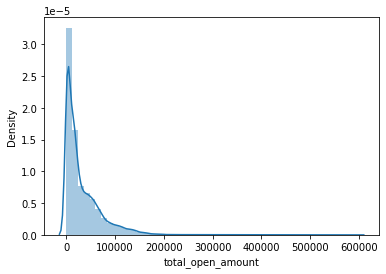

In [44]:
sb.distplot(X.total_open_amount)

In [45]:
X_train, X_local_test, y_train, y_local_test = train_test_split(X, Y, test_size=0.3,random_state=0)
X_local_test, X_local_validation, y_local_test, y_local_validation = train_test_split(X_train, y_train, test_size=0.5,random_state=0)

## Visualisation

In [46]:
pandas_profiling.ProfileReport(X)


Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:title={'center':'Correlation of Features'}>

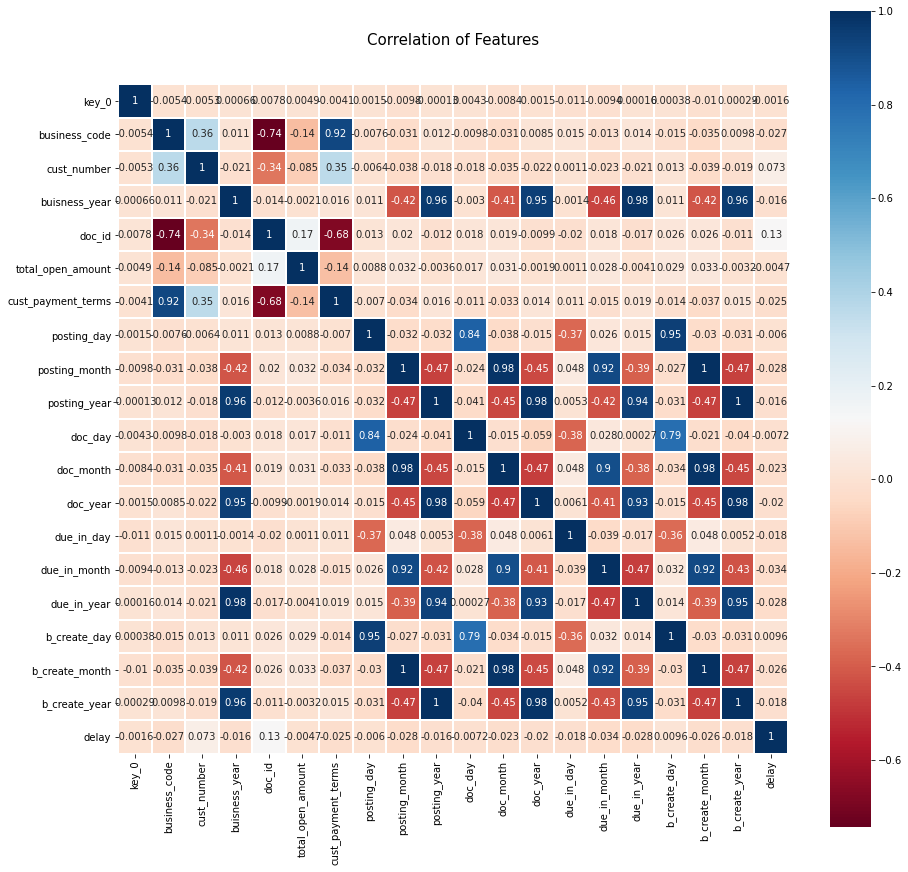

In [47]:
colormap = plt.cm.RdBu
plt.figure(figsize=(15,15))
plt.title('Correlation of Features', y=1.05, size=15)
sb.heatmap(X_train.merge(y_train , on = X_train.index ).corr(),linewidths=0.1,vmax=1.0, 
            square=True, cmap=colormap, linecolor='white', annot=True)

## Feature Engineering 

In [48]:
constant_filter = VarianceThreshold(threshold=0)
constant_filter.fit(X_train)
len(X_train.columns[constant_filter.get_support()])

18

In [49]:
X_train.dtypes

business_code           int32
cust_number             int32
buisness_year           int64
doc_id                float64
total_open_amount     float64
cust_payment_terms      int32
posting_day             int64
posting_month           int64
posting_year            int64
doc_day                 int64
doc_month               int64
doc_year                int64
due_in_day              int64
due_in_month            int64
due_in_year             int64
b_create_day            int64
b_create_month          int64
b_create_year           int64
dtype: object

In [50]:
constant_columns = [column for column in X_train.columns
                    if column not in X_train.columns[constant_filter.get_support()]]

print(len(constant_columns))

0


In [51]:
# transpose the feature matrice
X_train_T = X_train.T
# print the number of duplicated features
print(X_train_T.duplicated().sum())
# select the duplicated features columns names
duplicated_columns = X_train_T[X_train_T.duplicated()].index.values

0


In [52]:
def handling_correlation(df,threshold=0.8):
    # creating set to hold the correlated features
    corr_features = set()
    # create the correlation matrix (default to pearson)
    corr_matrix = df.corr()
    #code for selecting all correleated features
    for i in range(len(corr_matrix .columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >threshold:
                colname = corr_matrix.columns[i]
                corr_features.add(colname)
    return list(corr_features)

In [53]:
handling_correlation(X_train.copy(),0.85)

['doc_year',
 'due_in_month',
 'b_create_year',
 'doc_month',
 'b_create_month',
 'cust_payment_terms',
 'due_in_year',
 'b_create_day',
 'posting_year']

In [54]:
handling_correlation(df.copy(),0.85)

['doc_year',
 'due_in_month',
 'b_create_year',
 'doc_month',
 'b_create_month',
 'due_in_year',
 'b_create_day',
 'posting_year']

## Modelling

In [55]:
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR',LinearRegression())])))
pipelines.append(('ScaledLASSO', Pipeline([('Scaler', StandardScaler()),('LASSO', Lasso())])))
pipelines.append(('ScaledEN', Pipeline([('Scaler', StandardScaler()),('EN', ElasticNet())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsRegressor())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeRegressor())])))
pipelines.append(('ScaledGBM', Pipeline([('Scaler', StandardScaler()),('GBM', GradientBoostingRegressor())])))

results = []
names = []
for name, model in pipelines:
    kfold = KFold(n_splits=14, random_state=None)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

ScaledLR: -111.107071 (15.690344)
ScaledLASSO: -122.119130 (16.715384)
ScaledEN: -121.011377 (16.602459)
ScaledKNN: -104.344891 (13.888869)
ScaledCART: -150.246111 (24.950299)
ScaledGBM: -81.929802 (14.137126)


### KNN WILL SHOW THE BEST PREDICTION ACC TO PIPELINE ABOVE

In [56]:
neigh = KNeighborsRegressor(n_neighbors=2)
neigh.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=2)

In [57]:
neigh.predict(X_local_validation[4:10])

array([ 0.5,  5. ,  0.5, 16.5, -1. , -0.5])

In [58]:
neigh.predict(X_local_test[4:10])

array([ 2. , -2.5,  0. ,  2. , -4.5, -0.5])

In [59]:
neigh.score(X_local_validation, y_local_validation)

0.5446660389428688

In [60]:
neigh.score(X_local_test, y_local_test)

0.5107127883337172

In [61]:
y_pred=neigh.predict(X_local_test)

In [62]:
y_pred1=neigh.predict(X_local_validation)

In [63]:
predictions = pd.DataFrame({'Actual': y_local_validation, 'Predicted': y_pred1})
print(predictions.head())

       Actual  Predicted
41175    -2.0       -4.0
560      -3.0       -1.5
30325    29.0       12.5
33388     0.0        0.0
21587     0.0        0.5


In [64]:
y_pred=neigh.predict(X_local_test)

In [65]:
predictions = pd.DataFrame({'Actual': y_local_test, 'Predicted': y_pred})
print(predictions.head())

       Actual  Predicted
3638     -2.0        1.5
39062     0.0        1.5
23403     3.0        2.5
26451     3.0        1.5
22919     9.0        2.0


## prediction

In [66]:
df_test.dtypes

business_code          object
cust_number            object
buisness_year           int64
doc_id                float64
total_open_amount     float64
cust_payment_terms     object
delay                 float64
posting_day             int64
posting_month           int64
posting_year            int64
doc_day                 int64
doc_month               int64
doc_year                int64
due_in_day              int64
due_in_month            int64
due_in_year             int64
b_create_day            int64
b_create_month          int64
b_create_year           int64
dtype: object

In [67]:
df_train.dtypes

business_code           int32
cust_number             int32
buisness_year           int64
doc_id                float64
total_open_amount     float64
cust_payment_terms      int32
delay                 float64
posting_day             int64
posting_month           int64
posting_year            int64
doc_day                 int64
doc_month               int64
doc_year                int64
due_in_day              int64
due_in_month            int64
due_in_year             int64
b_create_day            int64
b_create_month          int64
b_create_year           int64
dtype: object

In [68]:
#final_res = neigh.predict(df_test)

In [69]:
#final_res = pd.Series(final_result,name='Delay')

In [70]:
#Final = df_test.merge(final_res , on = df_test.index )

In [71]:
#Final.drop('key_0',axis=1,inplace=True)